CNN Class Model Team 2 Project



CNN Model

tensor([[-0.0130,  0.2555,  0.0379, -0.2074, -0.0712,  0.1499]],
       grad_fn=<AddmmBackward0>)


In [ ]:
## try the model with the pre-text task (puzzle/jigsaw)

In [43]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import os
import itertools
import random
import matplotlib.pyplot as plt

# Define custom dataset
class BacteriaDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []

        # Collect all valid .tif images
        for dirpath, _, filenames in os.walk(root_dir):
            for file in filenames:
                if file.endswith('.tif') and not file.startswith(".ipynb_checkpoints"):
                    self.image_paths.append(os.path.join(dirpath, file))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path)  # Open the image
        img_array = np.array(image, dtype=np.float32)  # Convert to NumPy array
        img_array = (img_array - img_array.min()) / (img_array.max() - img_array.min() + 1e-5)  # Normalize to [0, 1]
        img_tensor = torch.tensor(img_array).unsqueeze(0)  # Add channel dimension
        if self.transform:
            img_tensor = self.transform(img_tensor)
        return img_tensor

# Define transformations
image_transforms = transforms.Compose([
    transforms.Resize((224, 224))  # Resize to fit ResNet input size
])

# Define Jigsaw Puzzle Pre-text Task
class JigsawDataset(BacteriaDataset):
    def __init__(self, root_dir, transform=None, grid_size=3):
        super(JigsawDataset, self).__init__(root_dir, transform)
        self.grid_size = grid_size
        self.permutations = list(itertools.permutations(range(grid_size ** 2)))
        random.shuffle(self.permutations)  # Randomize permutations

    def jigsaw_transform(self, image):
        patches = []
        c, h, w = image.shape  # Image dimensions
        patch_h, patch_w = h // self.grid_size, w // self.grid_size

        # Create grid patches
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                patches.append(image[:, i * patch_h:(i + 1) * patch_h, j * patch_w:(j + 1) * patch_w])

        # Apply a random permutation
        perm_idx = random.randint(0, len(self.permutations) - 1)
        permuted_patches = [patches[idx] for idx in self.permutations[perm_idx]]

        # Reassemble into a permuted grid
        permuted_image = torch.cat([torch.cat(permuted_patches[i * self.grid_size:(i + 1) * self.grid_size], dim=-1)
                                    for i in range(self.grid_size)], dim=-2)

        return permuted_image, torch.tensor(perm_idx, dtype=torch.long)

    def __getitem__(self, idx):
        image = super(JigsawDataset, self).__getitem__(idx)
        permuted_image, perm_idx = self.jigsaw_transform(image)
        return permuted_image, perm_idx

# Define Jigsaw Classifier
class JigsawClassifier(nn.Module):
    def __init__(self, base_model, num_permutations):
        super(JigsawClassifier, self).__init__()
        self.base_model = nn.Sequential(*list(base_model.children())[:-1])  # Remove FC layer
        self.classifier = nn.Linear(2048, num_permutations)

    def forward(self, x):
        features = self.base_model(x).squeeze(-1).squeeze(-1)  # Global average pooling
        logits = self.classifier(features)
        return logits

# Define ResNet model with skip connections, dilation convolutions, and decoder
class ResNetReconstruction(nn.Module):
    def __init__(self, base_model):
        super(ResNetReconstruction, self).__init__()
        self.base_layers = nn.Sequential(*list(base_model.children())[:-2])  # Extract up to the spatial feature maps

        # Apply dilation to conv layers
        for name, module in self.base_layers.named_children():
            if isinstance(module, nn.Conv2d):
                module.dilation = (2, 2)
                module.padding = (2, 2)

        # Decoder layers
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(2048, 1024, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.ConvTranspose2d(1024, 512, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid(),  # Normalize output to [0, 1]
        )

    def forward(self, x):
        features = self.base_layers(x)  # Extract feature maps
        reconstructed = self.decoder(features)  # Generate reconstructed image
        return features, reconstructed

# Define fine-tuning function for downstream task
def fine_tune_jigsaw(jigsaw_model, downstream_model, dataloader, criterion, optimizer, epochs=30):
    downstream_model.train()
    for epoch in range(epochs):
        epoch_loss = 0
        for batch_images, _ in dataloader:  # Use only images, not labels
            batch_images = batch_images.to(device)

            optimizer.zero_grad()
            features, reconstructed_image = downstream_model(batch_images)
            resized_images = F.interpolate(batch_images, size=(224, 224), mode='bilinear', align_corners=False)
            resized_reconstructed = F.interpolate(reconstructed_image, size=(224, 224), mode='bilinear', align_corners=False)

            # Convert single-channel to 3-channel
            resized_images_rgb = resized_images.repeat(1, 3, 1, 1)
            resized_reconstructed_rgb = resized_reconstructed.repeat(1, 3, 1, 1)

            loss = criterion(resized_reconstructed_rgb, resized_images_rgb)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        print(f"Epoch {epoch + 1}/{epochs}, Fine-tuning Loss: {epoch_loss / len(dataloader):.4f}")
        
        
# Load datasets and models
jigsaw_dataset = JigsawDataset(root_dir, transform=image_transforms)
jigsaw_loader = DataLoader(jigsaw_dataset, batch_size=1, shuffle=False)
num_permutations = len(jigsaw_dataset.permutations)

# Initialize models
resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
jigsaw_model = JigsawClassifier(resnet, num_permutations).to(device)
downstream_model = ResNetReconstruction(resnet).to(device)

# Define criterion and optimizer
criterion = PerceptualLoss().to(device)
optimizer = torch.optim.Adam(downstream_model.parameters(), lr=1e-4)

# Fine-tune the downstream task
fine_tune_jigsaw(jigsaw_model, downstream_model, jigsaw_loader, criterion, optimizer)

# Evaluate and visualize

downstream_model.eval()
with torch.no_grad():
    for batch_idx, (images, _) in enumerate(jigsaw_loader):
        images = images.to(device)

        features, reconstructed_image = downstream_model(images)

        for i in range(images.size(0)):
            original_image = images[i].cpu().numpy()[0]  # Extract original image
            reconstructed_image_sample = reconstructed_image[i].cpu().squeeze(0).numpy()  # Extract reconstructed image

            plt.figure(figsize=(15, 8))

            # Display original image
            plt.subplot(1, 3, 1)
            plt.imshow(original_image, cmap='gray')
            plt.title(f"Original Image {batch_idx * images.size(0) + i + 1}")
            plt.axis('off')

            # Display reconstructed image
            plt.subplot(1, 3, 2)
            plt.imshow(reconstructed_image_sample, cmap='gray')
            plt.title("Reconstructed Image")
            plt.axis('off')

            # Display one spatial feature map
            fmap = features[i].cpu().numpy()[0]  # Extract the first feature map
            plt.subplot(1, 3, 3)
            plt.imshow(fmap, cmap='viridis')
            plt.title("Sample Feature Map")
            plt.axis('off')

            plt.suptitle(f"Image {batch_idx * images.size(0) + i + 1}: Original, Reconstructed, and Sample Feature Map")
            plt.show()

            # Calculate and display perceptual loss
            resized_image = F.interpolate(images[i].unsqueeze(0), size=(224, 224), mode='bilinear', align_corners=False)
            resized_reconstructed = F.interpolate(reconstructed_image[i].unsqueeze(0), size=(224, 224), mode='bilinear', align_corners=False)
            resized_image_rgb = resized_image.repeat(1, 3, 1, 1)
            resized_reconstructed_rgb = resized_reconstructed.repeat(1, 3, 1, 1)
            perceptual_loss_value = criterion(resized_reconstructed_rgb, resized_image_rgb).item()
            print(f"Perceptual Loss for Image {batch_idx * images.size(0) + i + 1}: {perceptual_loss_value:.4f}")


ValueError: num_samples should be a positive integer value, but got num_samples=0

In [ ]:
## Visualize it various stages --------------------------

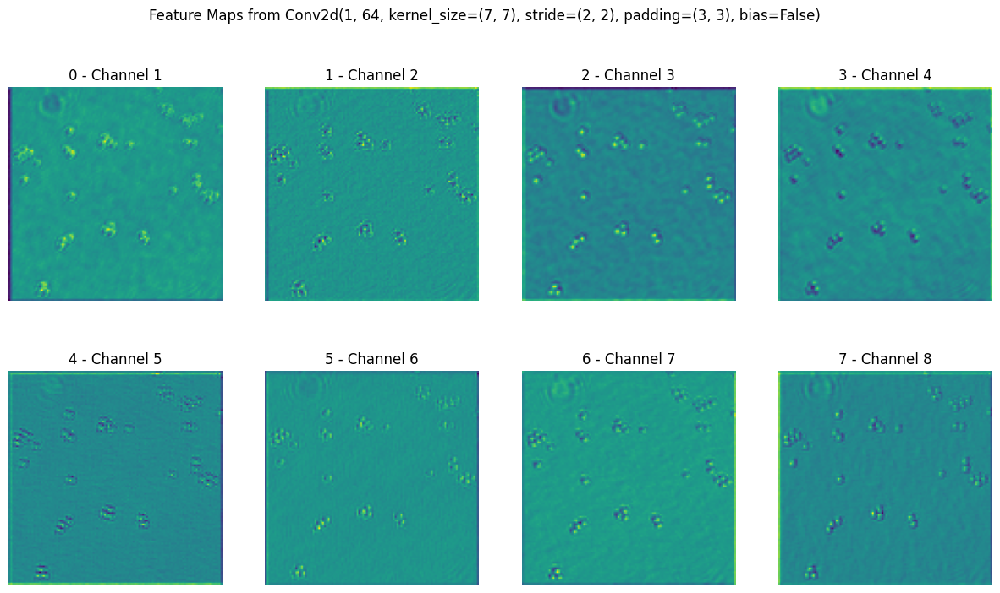

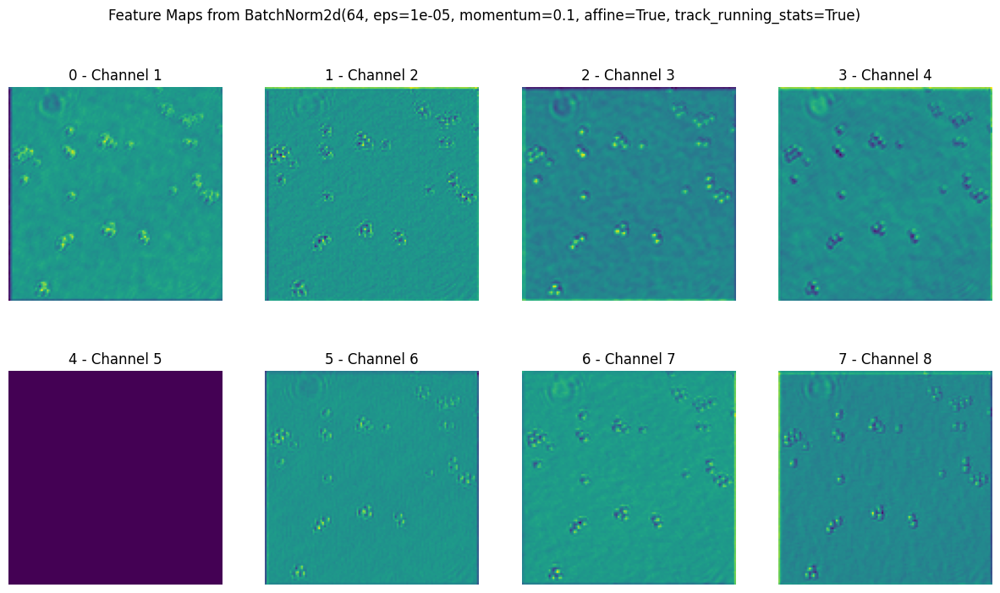

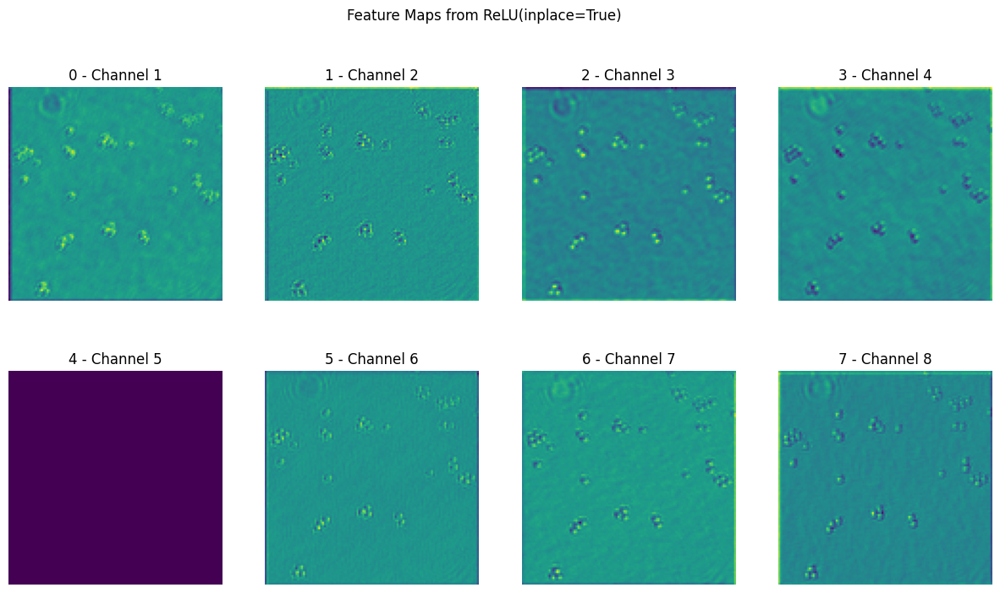

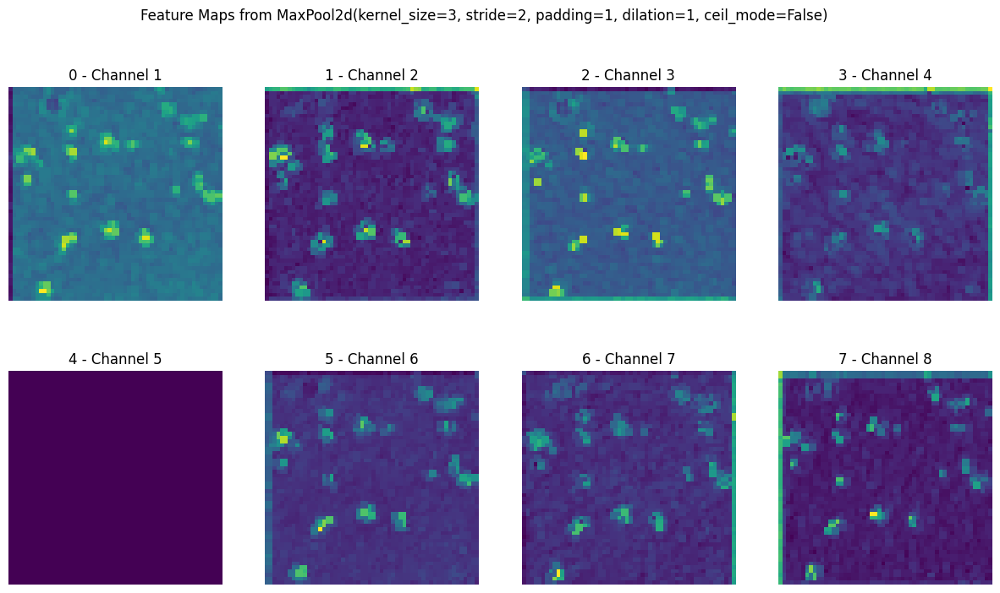

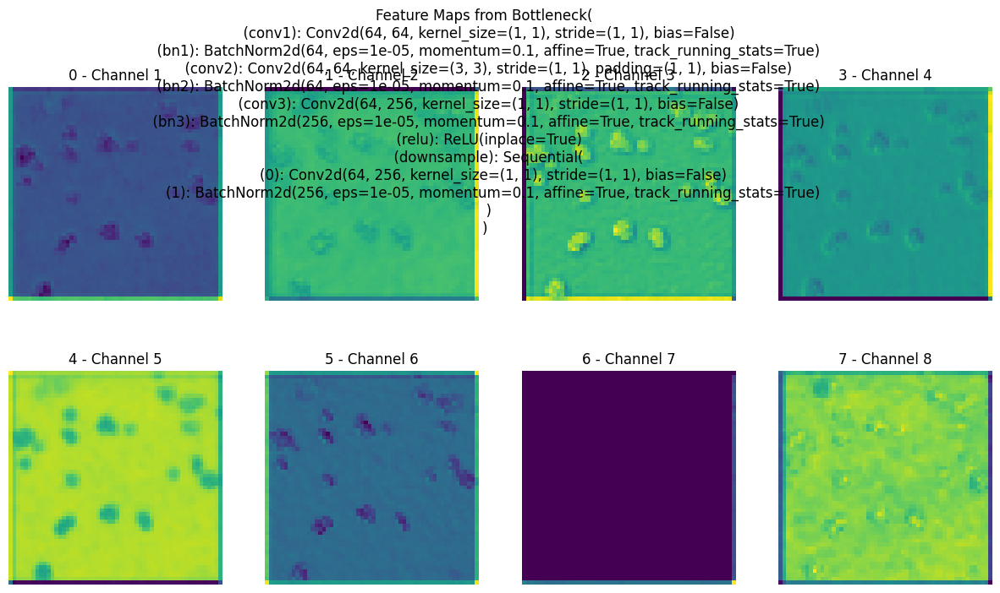

...

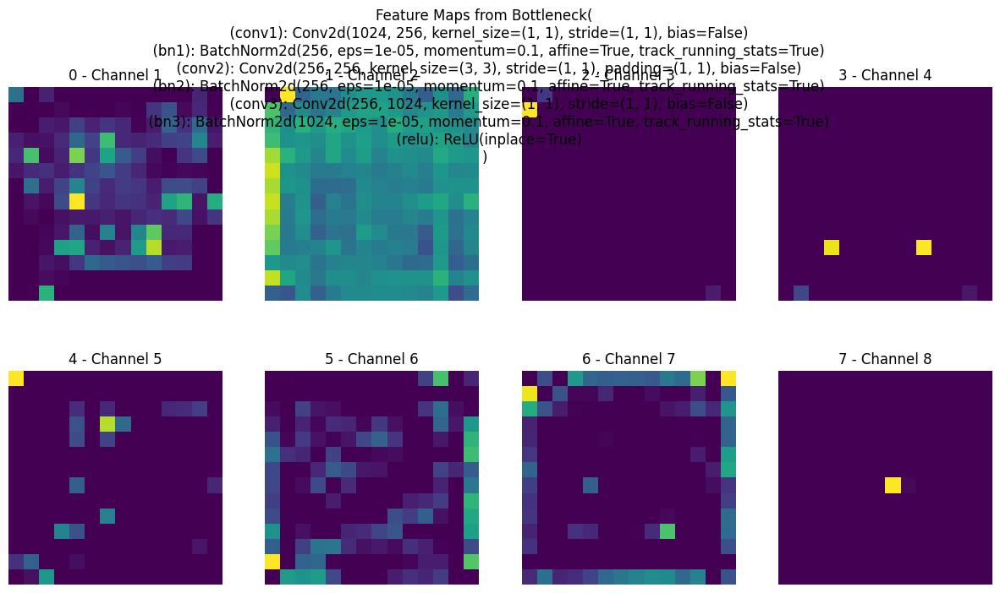

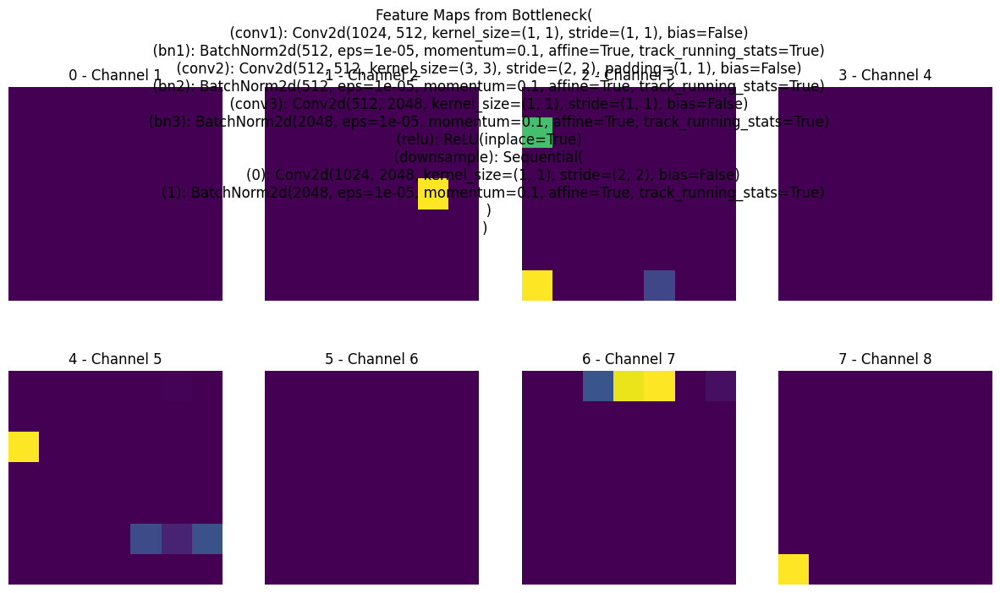

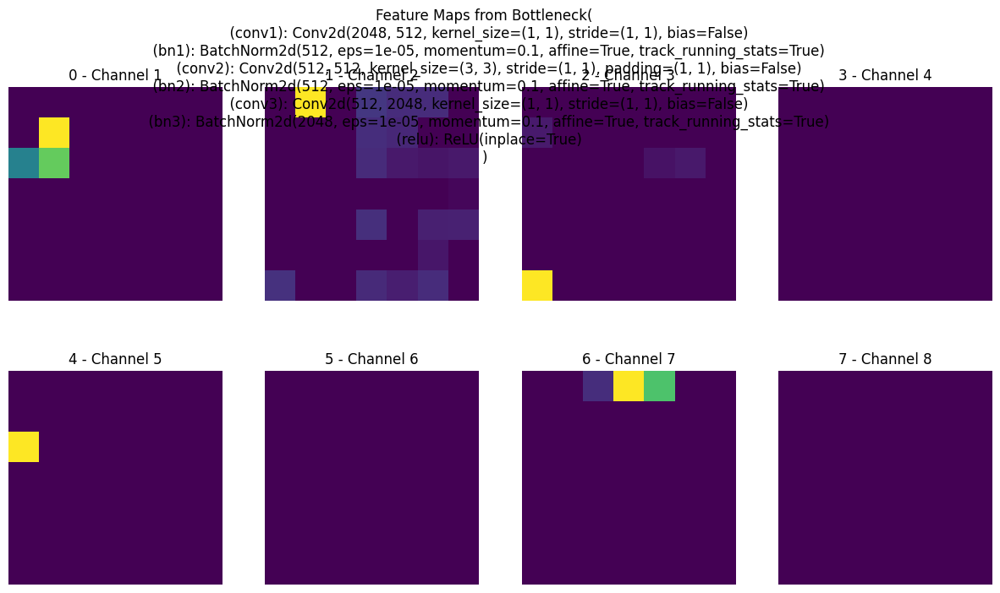

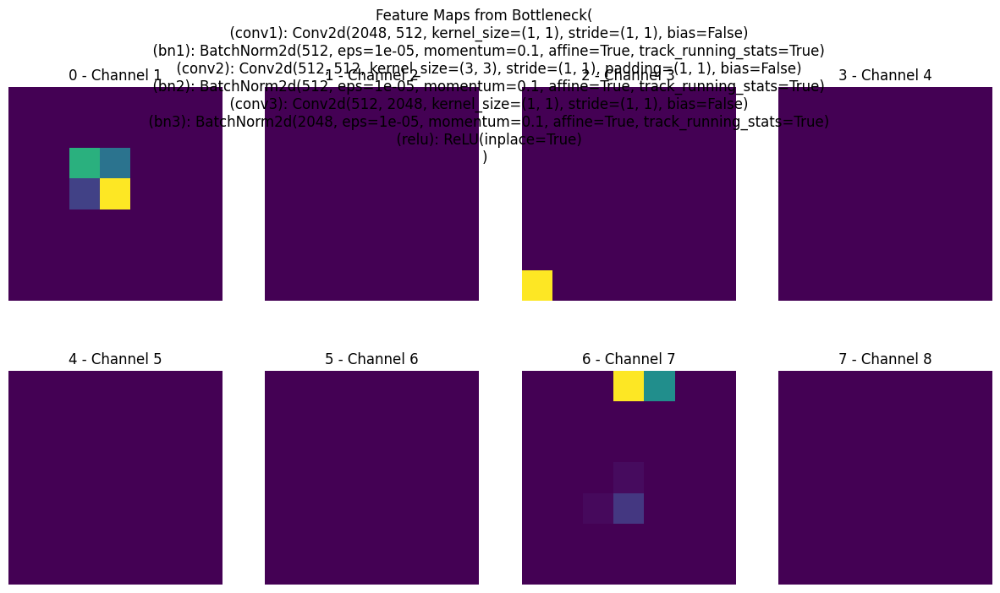

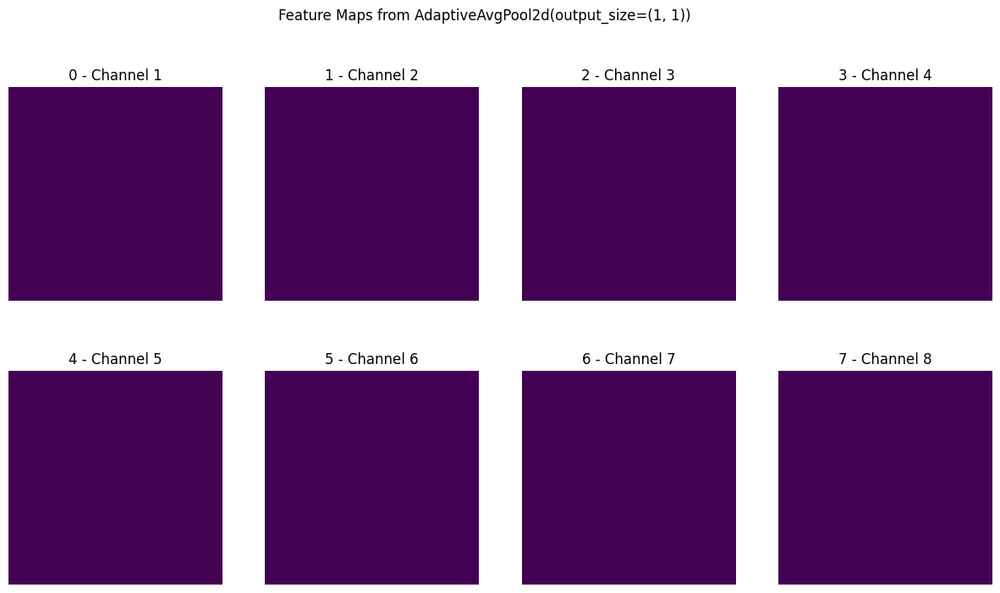

TypeError: Invalid shape () for image data

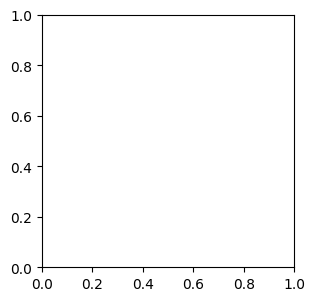

In [33]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt

# Define hooks to capture feature maps
feature_maps = {}

def hook_fn(module, input, output):
    """Hook function to capture feature maps."""
    feature_maps[module] = output

# Define custom dataset (unchanged)
class BacteriaDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        for dirpath, _, filenames in os.walk(root_dir):
            for file in filenames:
                if file.endswith('.tif') and not file.startswith(".ipynb_checkpoints"):
                    self.image_paths.append(os.path.join(dirpath, file))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path)
        img_array = np.array(image, dtype=np.float32)
        img_array = (img_array - img_array.min()) / (img_array.max() - img_array.min() + 1e-5)
        img_tensor = torch.tensor(img_array).unsqueeze(0)
        if self.transform:
            img_tensor = self.transform(img_tensor)
        return img_tensor

# Define transformations (unchanged)
image_transforms = transforms.Compose([
    transforms.Resize((224, 224))
])

# Load dataset and dataloader
root_dir = '/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/train/full_images/brightfield'
bacteria_dataset = BacteriaDataset(root_dir, transform=image_transforms)
bacteria_loader = DataLoader(bacteria_dataset, batch_size=1, shuffle=False)

# Load pretrained ResNet-50 model and modify for grayscale input
resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
with torch.no_grad():
    resnet.conv1.weight = nn.Parameter(resnet.conv1.weight[:, :1, :, :])

# Register hooks to intermediate layers
for name, layer in resnet.named_children():
    if isinstance(layer, nn.Sequential):  # Register hooks on the sequential layers
        for sub_name, sub_layer in layer.named_children():
            sub_layer.register_forward_hook(hook_fn)
    else:
        layer.register_forward_hook(hook_fn)

# Move model to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet = resnet.to(device)

# Visualize feature maps
resnet.eval()
with torch.no_grad():
    for batch_idx, images in enumerate(bacteria_loader):
        images = images.to(device)
        _ = resnet(images)  # Forward pass to capture feature maps

        # Plot feature maps from registered layers
        for module, fmap in feature_maps.items():
            fmap = fmap[0].cpu().numpy()  # Take the first image in the batch
            num_channels = fmap.shape[0]

            # Plot up to the first 8 channels
            plt.figure(figsize=(15, 8))
            for i in range(min(8, num_channels)):
                plt.subplot(2, 4, i + 1)
                plt.imshow(fmap[i], cmap='viridis')
                plt.title(f"{i} - Channel {i + 1}")
                plt.axis('off')

            plt.suptitle(f"Feature Maps from {module}")
            plt.show()

        # Process one image at a time
        break


In [35]:
## Lets use colorization, maybe better for edge detection 

In [19]:
root_dir = '/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/train/full_images/brightfield'


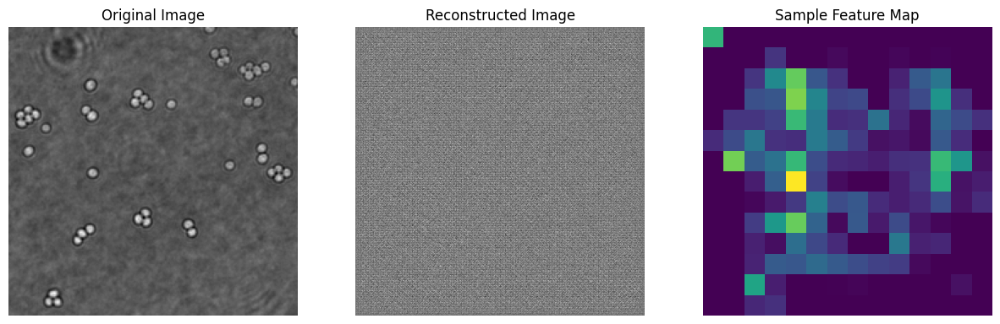

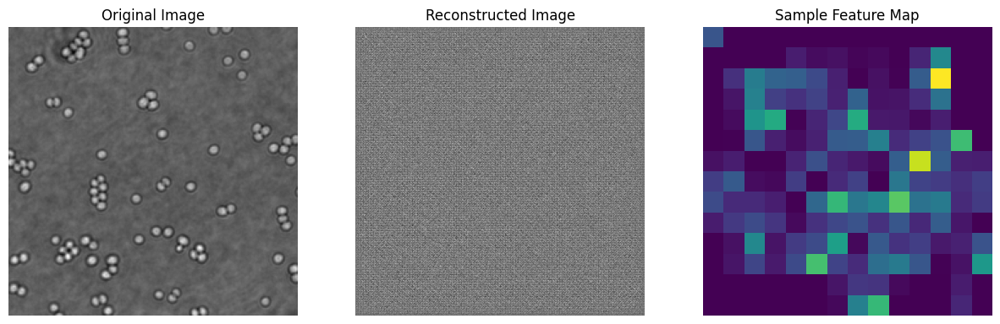

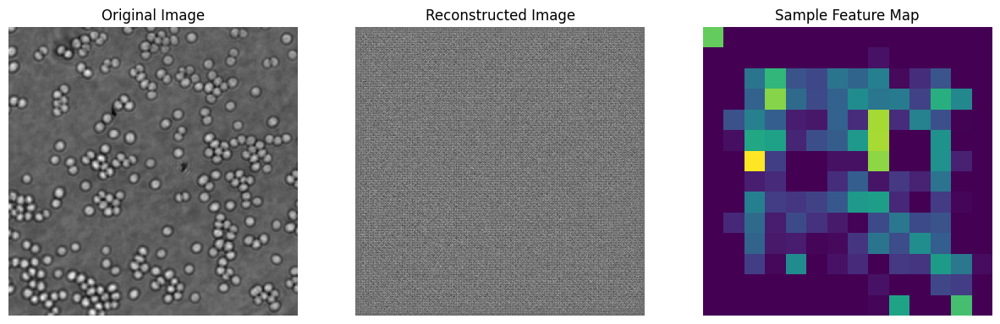

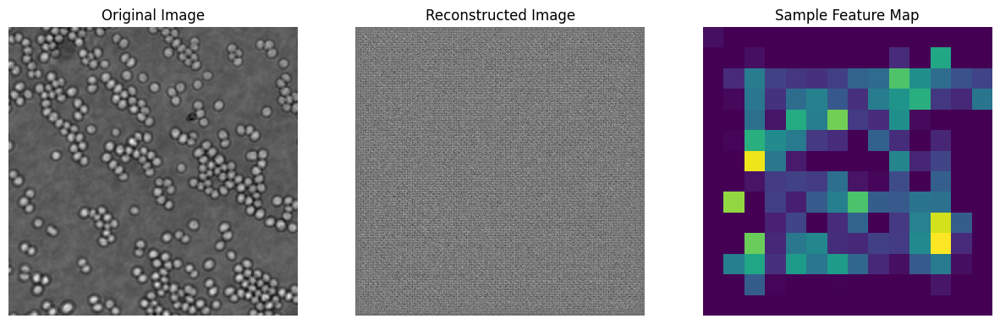

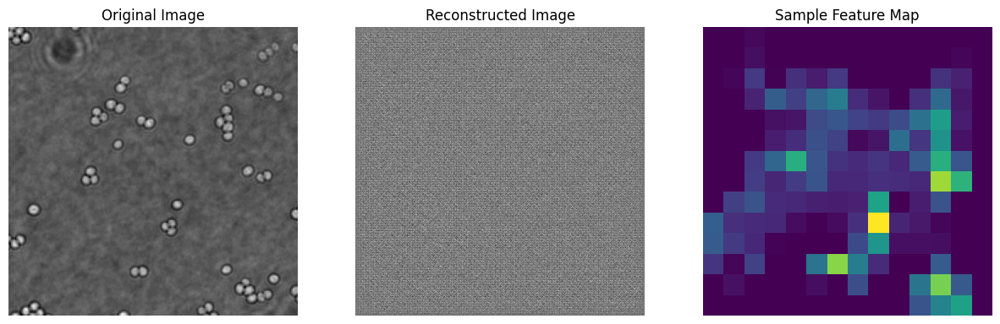

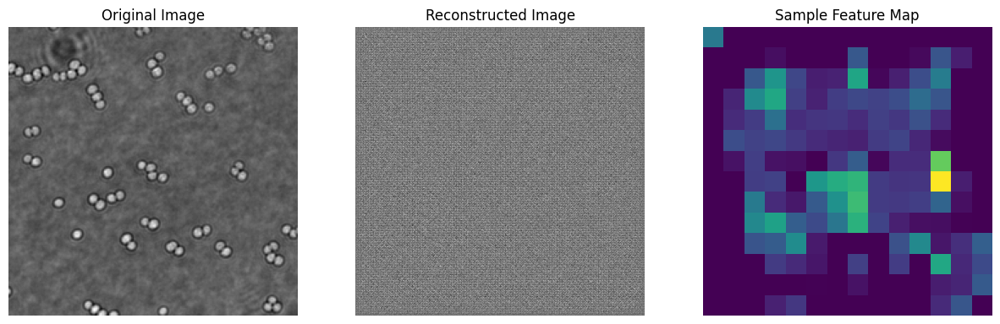

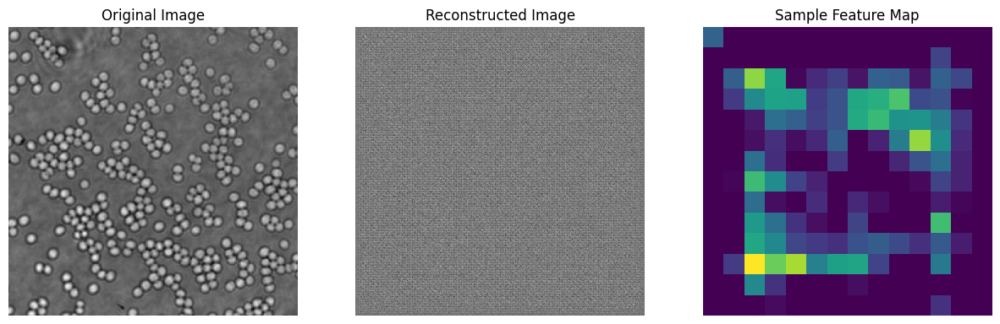

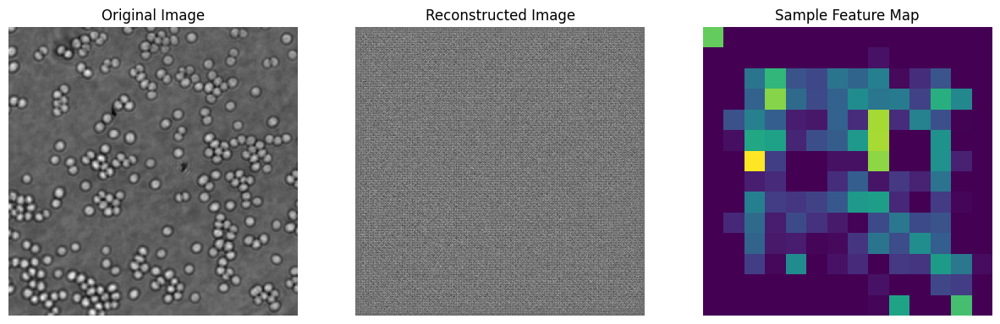

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt

# Define custom dataset
class BacteriaDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []

        # Collect all valid .tif images
        for dirpath, _, filenames in os.walk(root_dir):
            for file in filenames:
                if file.endswith('.tif') and not file.startswith(".ipynb_checkpoints"):
                    self.image_paths.append(os.path.join(dirpath, file))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path)  # Open the image
        img_array = np.array(image, dtype=np.float32)  # Convert to NumPy array
        img_array = (img_array - img_array.min()) / (img_array.max() - img_array.min() + 1e-5)  # Normalize to [0, 1]
        img_tensor = torch.tensor(img_array).unsqueeze(0)  # Add channel dimension
        if self.transform:
            img_tensor = self.transform(img_tensor)
        return img_tensor

# Define transformations
image_transforms = transforms.Compose([
    transforms.Resize((224, 224))  # Resize to fit ResNet input size
])

# Define Transformer for Image Reconstruction
class TransformerReconstruction(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_heads, num_layers, grid_dim):
        super(TransformerReconstruction, self).__init__()
        self.grid_dim = grid_dim

        # Positional Encoding
        self.positional_encoding = nn.Parameter(torch.randn(1, grid_dim**2, hidden_dim))

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(d_model=hidden_dim, nhead=num_heads)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Tokenizer and Reconstructor
        self.tokenizer = nn.Linear(input_dim, hidden_dim)
        self.reconstructor = nn.Linear(hidden_dim, input_dim)

    def forward(self, x):
        # Downsample feature map to match positional encoding size
        x = F.adaptive_avg_pool2d(x, (self.grid_dim, self.grid_dim))  # Downsample to grid_dim x grid_dim

        # Reshape feature map into tokens
        batch_size, channels, height, width = x.shape
        tokens = x.permute(0, 2, 3, 1).reshape(batch_size, -1, channels)  # [B, N, C]
        tokens = self.tokenizer(tokens)  # Map to transformer input dim
        tokens += self.positional_encoding  # Add positional encoding

        # Process tokens through transformer
        transformed_tokens = self.transformer(tokens)

        # Reconstruct the feature map from tokens
        reconstructed_tokens = self.reconstructor(transformed_tokens)  # [B, N, C]
        reconstructed_feature_map = reconstructed_tokens.reshape(batch_size, height, width, channels).permute(0, 3, 1, 2)

        return reconstructed_feature_map

# Define a modified ResNet with only up to layer3
class EarlyResNet(nn.Module):
    def __init__(self):
        super(EarlyResNet, self).__init__()
        base_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        base_model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)  # Modify for grayscale input
        self.early_layers = nn.Sequential(
            base_model.conv1,
            base_model.bn1,
            base_model.relu,
            base_model.maxpool,
            base_model.layer1,
            base_model.layer2,
            base_model.layer3  # Extract up to layer3
        )

    def forward(self, x):
        return self.early_layers(x)

# Combine the Early ResNet, Transformer, and Decoder
class TransformerEnhancedResNet(nn.Module):
    def __init__(self, early_resnet, transformer):
        super(TransformerEnhancedResNet, self).__init__()
        self.feature_extractor = early_resnet  # Early ResNet layers
        self.transformer = transformer  # Transformer for feature map tokens
        self.decoder = nn.Sequential(  # Enhanced Image reconstruction decoder
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),  # Normalize output to [0, 1]
        )

    def forward(self, x):
        features = self.feature_extractor(x)  # Extract features from early ResNet
        transformed_features = self.transformer(features)  # Process features with transformer
        reconstructed = self.decoder(transformed_features)  # Reconstruct the image
        return features, reconstructed

# Initialize the Early ResNet, Transformer, and Combined Model
early_resnet = EarlyResNet()
transformer = TransformerReconstruction(input_dim=1024, hidden_dim=512, num_heads=4, num_layers=3, grid_dim=28)
model = TransformerEnhancedResNet(early_resnet, transformer).to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))

# Load dataset and dataloader
root_dir = '/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/train/full_images/brightfield'
bacteria_dataset = BacteriaDataset(root_dir, transform=image_transforms)
bacteria_loader = DataLoader(bacteria_dataset, batch_size=1, shuffle=False)

# Evaluate and visualize results
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
with torch.no_grad():
    for batch_idx, images in enumerate(bacteria_loader):
        images = images.to(device)

        # Forward pass through enhanced model
        spatial_feature_maps, reconstructed_image = model(images)

        # Visualize results
        original_image = images[0].cpu().numpy()[0]
        reconstructed_image = reconstructed_image[0].cpu().squeeze(0).numpy()
        fmap = spatial_feature_maps[0].cpu().numpy()[0]

        plt.figure(figsize=(15, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(original_image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(reconstructed_image, cmap='gray')
        plt.title("Reconstructed Image")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(fmap, cmap='viridis')
        plt.title("Sample Feature Map")
        plt.axis('off')

        plt.show()


In [32]:
## we are trying both toegther but with more complexity

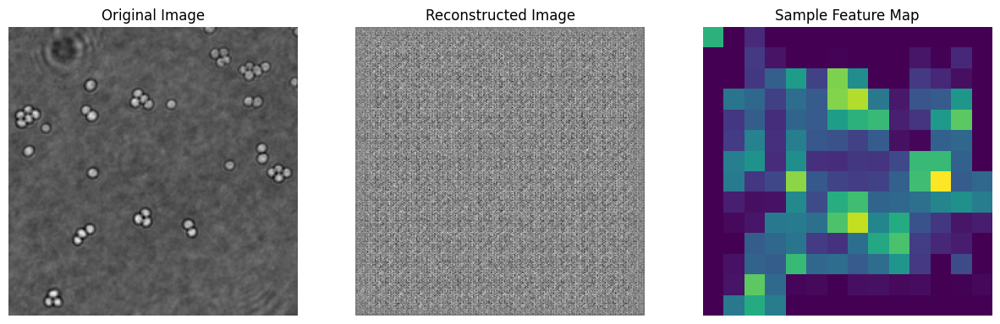

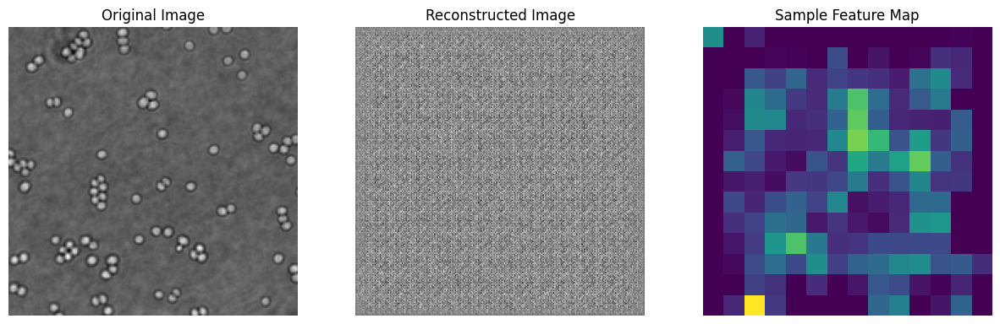

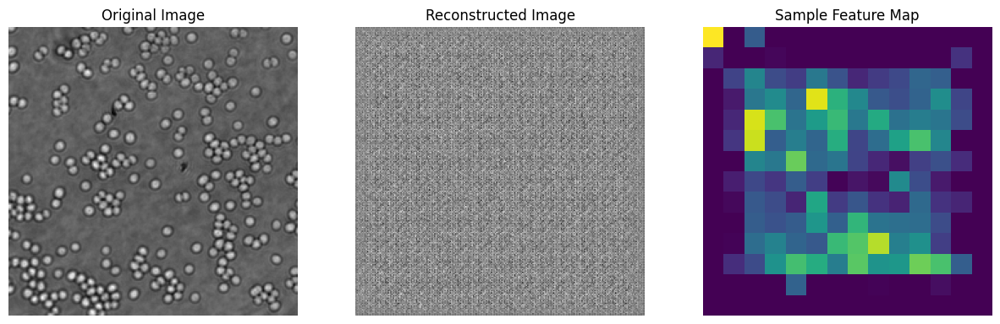

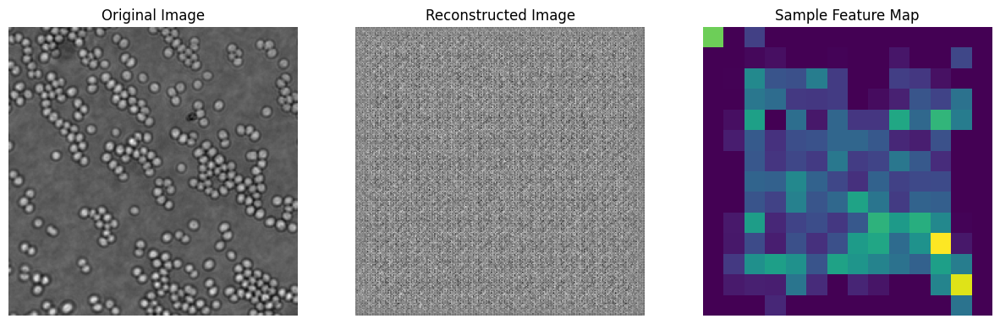

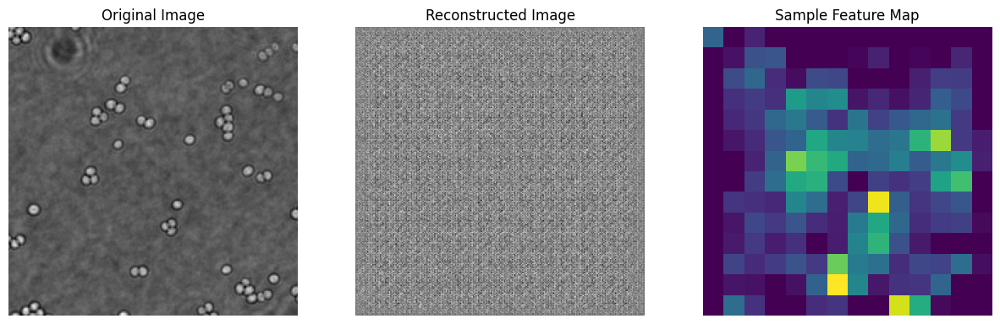

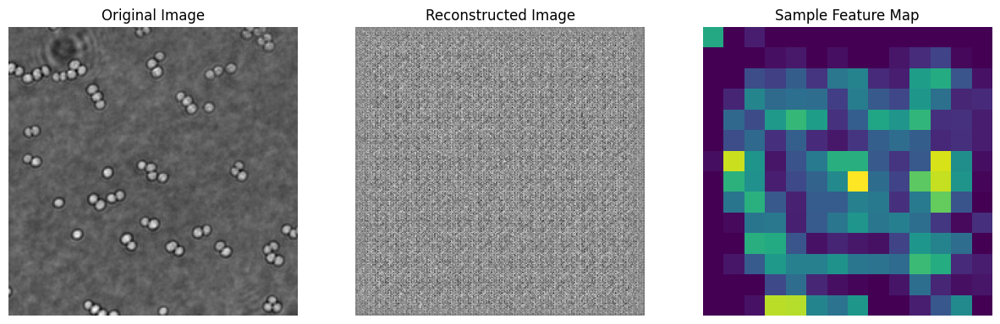

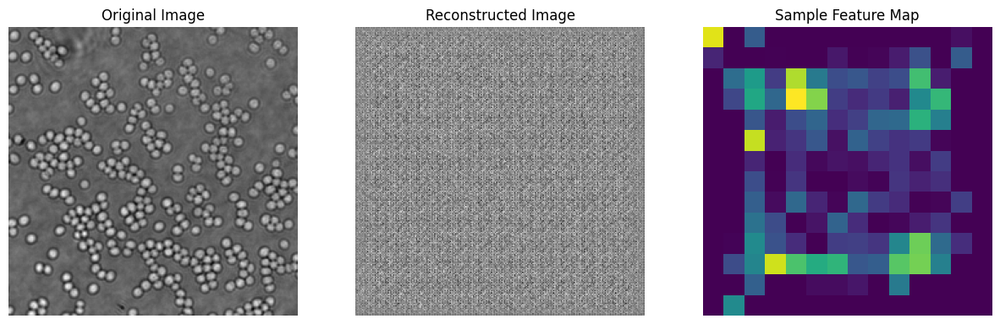

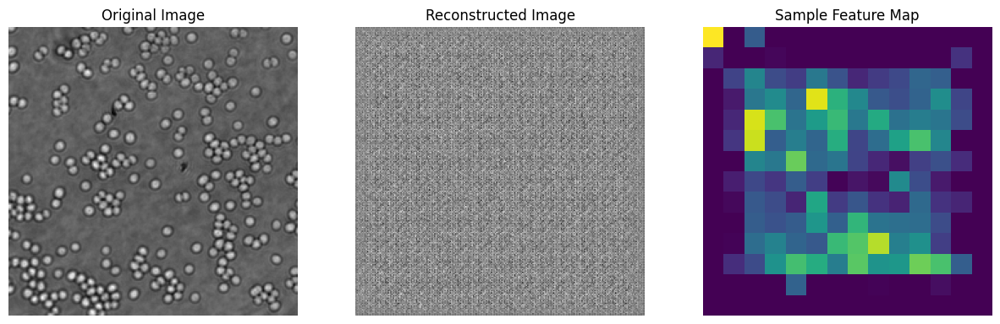

In [30]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt


# Define custom dataset
class BacteriaDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []

        # Collect all valid .tif images
        for dirpath, _, filenames in os.walk(root_dir):
            for file in filenames:
                if file.endswith('.tif') and not file.startswith(".ipynb_checkpoints"):
                    self.image_paths.append(os.path.join(dirpath, file))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path)  # Open the image
        img_array = np.array(image, dtype=np.float32)  # Convert to NumPy array
        img_array = (img_array - img_array.min()) / (img_array.max() - img_array.min() + 1e-5)  # Normalize to [0, 1]
        img_tensor = torch.tensor(img_array).unsqueeze(0)  # Add channel dimension
        if self.transform:
            img_tensor = self.transform(img_tensor)
        return img_tensor


# Define transformations
image_transforms = transforms.Compose([
    transforms.Resize((224, 224))  # Resize to fit ResNet input size
])


# Define Transformer for Image Reconstruction
class TransformerReconstruction(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_heads, num_layers, grid_dim):
        super(TransformerReconstruction, self).__init__()
        self.grid_dim = grid_dim

        # Positional Encoding
        self.positional_encoding = nn.Parameter(torch.randn(1, grid_dim**2, hidden_dim))

        # Transformer Encoder with Increased Complexity
        encoder_layer = nn.TransformerEncoderLayer(d_model=hidden_dim, nhead=num_heads, dim_feedforward=hidden_dim * 4)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Tokenizer and Reconstructor
        self.tokenizer = nn.Linear(input_dim, hidden_dim)
        self.reconstructor = nn.Linear(hidden_dim, input_dim)

    def forward(self, x):
        # Downsample feature map to match positional encoding size
        x = F.adaptive_avg_pool2d(x, (self.grid_dim, self.grid_dim))  # Downsample to grid_dim x grid_dim

        # Reshape feature map into tokens
        batch_size, channels, height, width = x.shape
        tokens = x.permute(0, 2, 3, 1).reshape(batch_size, -1, channels)  # [B, N, C]
        tokens = self.tokenizer(tokens)  # Map to transformer input dim
        tokens += self.positional_encoding  # Add positional encoding

        # Process tokens through transformer
        transformed_tokens = self.transformer(tokens)

        # Reconstruct the feature map from tokens
        reconstructed_tokens = self.reconstructor(transformed_tokens)  # [B, N, C]
        reconstructed_feature_map = reconstructed_tokens.reshape(batch_size, height, width, channels).permute(0, 3, 1, 2)

        return reconstructed_feature_map


# Define a modified ResNet with only up to layer3
class EarlyResNet(nn.Module):
    def __init__(self):
        super(EarlyResNet, self).__init__()
        base_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        base_model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)  # Modify for grayscale input
        self.early_layers = nn.Sequential(
            base_model.conv1,
            base_model.bn1,
            base_model.relu,
            base_model.maxpool,
            base_model.layer1,
            base_model.layer2,
            base_model.layer3  # Extract up to layer3
        )

    def forward(self, x):
        return self.early_layers(x)


# Combine the Early ResNet, Transformer, and Decoder
class TransformerEnhancedResNet(nn.Module):
    def __init__(self, early_resnet, transformer):
        super(TransformerEnhancedResNet, self).__init__()
        self.feature_extractor = early_resnet  # Early ResNet layers
        self.transformer = transformer  # Transformer for feature map tokens
        self.decoder = nn.Sequential(  # Enhanced Image reconstruction decoder
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),  # Normalize output to [0, 1]
        )

    def forward(self, x):
        features = self.feature_extractor(x)  # Extract features from early ResNet
        transformed_features = self.transformer(features)  # Process features with transformer
        reconstructed = self.decoder(transformed_features)  # Reconstruct the image
        return features, reconstructed


# Initialize the Early ResNet, Transformer, and Combined Model
early_resnet = EarlyResNet()
transformer = TransformerReconstruction(input_dim=1024, hidden_dim=768, num_heads=12, num_layers=8, grid_dim=14)  # Increased complexity
model = TransformerEnhancedResNet(early_resnet, transformer).to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))

# Load dataset and dataloader
root_dir = '/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/train/full_images/brightfield'
bacteria_dataset = BacteriaDataset(root_dir, transform=image_transforms)
bacteria_loader = DataLoader(bacteria_dataset, batch_size=1, shuffle=False)

# Evaluate and visualize results
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
with torch.no_grad():
    for batch_idx, images in enumerate(bacteria_loader):
        images = images.to(device)

        # Forward pass through enhanced model
        spatial_feature_maps, reconstructed_image = model(images)

        # Visualize results
        original_image = images[0].cpu().numpy()[0]
        reconstructed_image = reconstructed_image[0].cpu().squeeze(0).numpy()
        fmap = spatial_feature_maps[0].cpu().numpy()[0]

        plt.figure(figsize=(15, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(original_image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(reconstructed_image, cmap='gray')
        plt.title("Reconstructed Image")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(fmap, cmap='viridis')
        plt.title("Sample Feature Map")
        plt.axis('off')

        plt.show()


In [1]:
root_dir = '/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/train/full_images/brightfield'
# This is finallll code

Epoch 1/1000, Loss: 0.550349
Epoch 2/1000, Loss: 0.597410
Epoch 3/1000, Loss: 0.516677
Epoch 4/1000, Loss: 0.490457
Epoch 5/1000, Loss: 0.448886
Epoch 6/1000, Loss: 0.428922
Epoch 7/1000, Loss: 0.401378
Epoch 8/1000, Loss: 0.380646
Epoch 9/1000, Loss: 0.362124
Epoch 10/1000, Loss: 0.349303
Epoch 11/1000, Loss: 0.333472
Epoch 12/1000, Loss: 0.323460
Epoch 13/1000, Loss: 0.314843
Epoch 14/1000, Loss: 0.307385
Epoch 15/1000, Loss: 0.300079
Epoch 16/1000, Loss: 0.297109
Epoch 17/1000, Loss: 0.292212
Epoch 18/1000, Loss: 0.287332
Epoch 19/1000, Loss: 0.286468
Epoch 20/1000, Loss: 0.282970
Epoch 21/1000, Loss: 0.279501
Epoch 22/1000, Loss: 0.277338
Epoch 23/1000, Loss: 0.272317
Epoch 24/1000, Loss: 0.268873
Epoch 25/1000, Loss: 0.267075
Epoch 26/1000, Loss: 0.265581
Epoch 27/1000, Loss: 0.263620
Epoch 28/1000, Loss: 0.260660
Epoch 29/1000, Loss: 0.259131
Epoch 30/1000, Loss: 0.257969
Epoch 31/1000, Loss: 0.255809
Epoch 32/1000, Loss: 0.253736
Epoch 33/1000, Loss: 0.251538
Epoch 34/1000, Loss

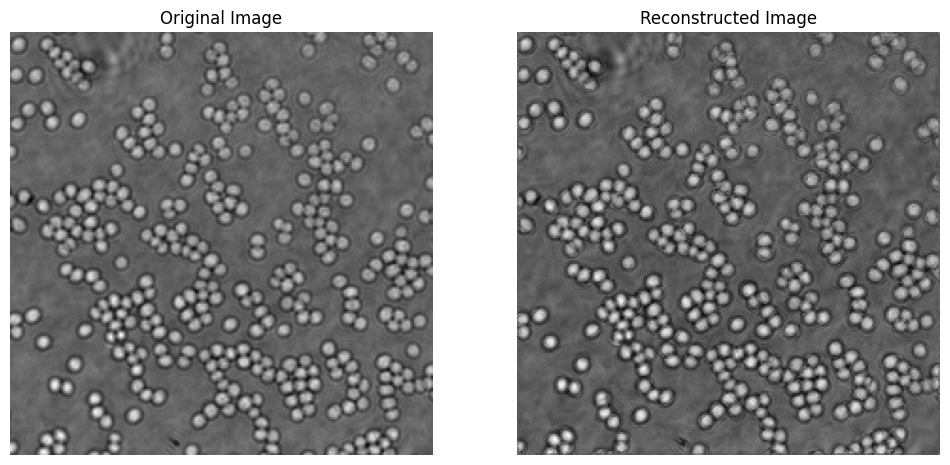

In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt


# Define custom dataset
class BacteriaDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []

        # Collect all valid .tif images
        for dirpath, _, filenames in os.walk(root_dir):
            for file in filenames:
                if file.endswith('.tif') and not file.startswith(".ipynb_checkpoints"):
                    self.image_paths.append(os.path.join(dirpath, file))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path)  # Open the image
        img_array = np.array(image, dtype=np.float32)  # Convert to NumPy array
        img_array = (img_array - img_array.min()) / (img_array.max() - img_array.min() + 1e-5)  # Normalize to [0, 1]
        img_tensor = torch.tensor(img_array).unsqueeze(0)  # Add channel dimension
        if self.transform:
            img_tensor = self.transform(img_tensor)
        return img_tensor


# Define transformations
image_transforms = transforms.Compose([
    transforms.Resize((224, 224))  # Resize to fit ResNet input size
])


# Define Transformer for Image Reconstruction
class TransformerReconstruction(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_heads, num_layers, grid_dim):
        super(TransformerReconstruction, self).__init__()
        self.grid_dim = grid_dim

        # Positional Encoding
        self.positional_encoding = nn.Parameter(torch.randn(1, grid_dim**2, hidden_dim))

        # Transformer Encoder with Increased Complexity
        encoder_layer = nn.TransformerEncoderLayer(d_model=hidden_dim, nhead=num_heads, dim_feedforward=hidden_dim * 4)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Tokenizer and Reconstructor
        self.tokenizer = nn.Linear(input_dim, hidden_dim)
        self.reconstructor = nn.Linear(hidden_dim, input_dim)

    def forward(self, x):
        # Downsample feature map to match positional encoding size
        x = F.adaptive_avg_pool2d(x, (self.grid_dim, self.grid_dim))  # Downsample to grid_dim x grid_dim

        # Reshape feature map into tokens
        batch_size, channels, height, width = x.shape
        tokens = x.permute(0, 2, 3, 1).reshape(batch_size, -1, channels)  # [B, N, C]
        tokens = self.tokenizer(tokens)  # Map to transformer input dim
        tokens += self.positional_encoding  # Add positional encoding

        # Process tokens through transformer
        transformed_tokens = self.transformer(tokens)

        # Reconstruct the feature map from tokens
        reconstructed_tokens = self.reconstructor(transformed_tokens)  # [B, N, C]
        reconstructed_feature_map = reconstructed_tokens.reshape(batch_size, height, width, channels).permute(0, 3, 1, 2)

        return reconstructed_feature_map


# Define a modified ResNet with only up to layer3
class EarlyResNet(nn.Module):
    def __init__(self):
        super(EarlyResNet, self).__init__()
        base_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        base_model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)  # Modify for grayscale input
        self.early_layers = nn.Sequential(
            base_model.conv1,
            base_model.bn1,
            base_model.relu,
            base_model.maxpool,
            base_model.layer1,
            base_model.layer2,
            base_model.layer3  # Extract up to layer3
        )

    def forward(self, x):
        return self.early_layers(x)


# Combine the Early ResNet, Transformer, and Decoder
class TransformerEnhancedResNet(nn.Module):
    def __init__(self, early_resnet, transformer):
        super(TransformerEnhancedResNet, self).__init__()
        self.feature_extractor = early_resnet  # Early ResNet layers
        self.transformer = transformer  # Transformer for feature map tokens
        self.decoder = nn.Sequential(  # Enhanced Image reconstruction decoder
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),  # Normalize output to [0, 1]
        )

    def forward(self, x):
        features = self.feature_extractor(x)  # Extract features from early ResNet
        transformed_features = self.transformer(features)  # Process features with transformer
        reconstructed = self.decoder(transformed_features)  # Reconstruct the image
        return features, reconstructed


# Perceptual Loss using VGG
class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features[:12].eval()
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg

    def forward(self, x, y):
        # Convert grayscale to 3-channel images for perceptual loss
        x = x.repeat(1, 3, 1, 1)
        y = y.repeat(1, 3, 1, 1)
        x_features = self.vgg(x)
        y_features = self.vgg(y)
        loss = F.mse_loss(x_features, y_features)
        return loss


# Initialize the Early ResNet, Transformer, and Combined Model
early_resnet = EarlyResNet()
transformer = TransformerReconstruction(input_dim=1024, hidden_dim=768, num_heads=8, num_layers=4, grid_dim=14)
model = TransformerEnhancedResNet(early_resnet, transformer).to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))

# Training Configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
learning_rate = 1e-4
num_epochs = 1000

# Loss functions
mse_loss = nn.MSELoss()
perceptual_loss = PerceptualLoss().to(device)

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Dataset and DataLoader

bacteria_dataset = BacteriaDataset(root_dir, transform=image_transforms)
bacteria_loader = DataLoader(bacteria_dataset, batch_size=16, shuffle=True)

# Training Loop
model.train()
for epoch in range(num_epochs):
    total_loss = 0
    for batch_idx, images in enumerate(bacteria_loader):
        images = images.to(device)

        # Forward pass
        _, reconstructed_images = model(images)

        # Compute losses
        mse = mse_loss(reconstructed_images, images)
        perceptual = perceptual_loss(reconstructed_images, images)
        loss = mse + 0.1 * perceptual

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {total_loss / len(bacteria_loader):.6f}")

# Visualize final reconstruction
model.eval()
with torch.no_grad():
    for images in bacteria_loader:
        images = images.to(device)
        _, reconstructed_images = model(images)

        # Visualize results
        original_image = images[0].cpu().numpy()[0]
        reconstructed_image = reconstructed_images[0].cpu().squeeze(0).numpy()

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(original_image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(reconstructed_image, cmap='gray')
        plt.title("Reconstructed Image")
        plt.axis('off')
        plt.show()
        break


In [1]:
## lets try counting
root_dir = '/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/train/full_images/brightfield'


RuntimeError: CUDA error: all CUDA-capable devices are busy or unavailable
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.